<a href="https://colab.research.google.com/github/UmaiRyden/AI-Teacher/blob/main/notebooks/how-to-segment-images-with-segment-anything-3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Segment Images with Segment Anything 3 (SAM3)

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-segment-images-with-segment-anything-3.ipynb) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://www.youtube.com/watch?v=G1AEuFwQrWU) [![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/sam3/) [![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/facebookresearch/sam3)

SAM 3 (Segment Anything Model 3) extends the SAM series by moving from segmenting individual objects to understanding and segmenting all instances of a concept in images and videos. It introduces Promptable Concept Segmentation (PCS), where users specify a concept through short noun phrases like “striped cat” or by providing visual exemplars. The model detects, segments, and tracks every matching object, preserving identities across frames.


## Environment setup

### Configure your API keys

To pull Segment Anything 3 weights, you need a HuggingFace Access Token with approved access to the SAM 3 checkpoints.

- Request access to the SAM 3 checkpoints on the official Hugging Face [repo](https://github.com/facebookresearch/sam3).
- Open your HuggingFace Settings page. Click Access Tokens then New Token to generate a new token.
- In Colab, go to the left pane and click on Secrets (🔑). Store your HuggingFace Access Token under the name `HF_TOKEN`.








In [1]:
import os
from google.colab import userdata

os.environ["HF_TOKEN"] = userdata.get("HF_TOKEN")

### Check GPU availability

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `T4 GPU`, and then click `Save`.

In [2]:
!nvidia-smi

Sat Dec 20 16:26:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
import torch
import torchvision

print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())

PyTorch version: 2.9.0+cu126
Torchvision version: 0.24.0+cu126
CUDA is available: True


### Install SAM 3 and extra dependencies

In [4]:
!git clone https://github.com/facebookresearch/sam3.git
%cd sam3
!pip install -e ".[notebooks]"
%cd /content

Cloning into 'sam3'...
remote: Enumerating objects: 620, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (11/11), done.
remote: Total 620 (delta 24), reused 21 (delta 21), pack-reused 588 (from 2)
Receiving objects: 100% (620/620), 58.95 MiB | 21.82 MiB/s, done.
Resolving deltas: 100% (95/95), done.
/content/sam3
Obtaining file:///content/sam3
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of opencv-python to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 

/content


In [1]:
!pip install -q supervision jupyter_bbox_widget

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.4/212.4 kB 8.1 MB/s eta 0:00:00


### Download example data

Downloads example images. You can use these or replace them with your own images.

In [2]:
!wget -q https://media.roboflow.com/notebooks/examples/solvay_conference_1927.jpg
!wget -q https://media.roboflow.com/notebooks/examples/birds.jpg
!wget -q https://media.roboflow.com/notebooks/examples/pills.jpg
!wget -q https://media.roboflow.com/notebooks/examples/eggs.jpg
!wget -q https://media.roboflow.com/notebooks/examples/traffic_jam.jpg
!wget -q https://media.roboflow.com/notebooks/examples/airport.jpg
!wget -q https://media.roboflow.com/notebooks/examples/basketball_game.jpg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg

**<font color="red">⚠️ Restart session before running cells below.</font>**








## Load SAM3 Image Predictor

On Ampere GPUs (compute capability ≥ 8), we enable TensorFloat-32 (TF32) for matrix multiplications and convolutions. This allows PyTorch to use tensor cores to accelerate FP32 computations while maintaining similar numerical accuracy.

In [3]:
import torch

torch.autocast(device_type="cuda", dtype=torch.bfloat16).__enter__()

if torch.cuda.get_device_properties(0).major >= 8:
    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

In [4]:
from sam3.model_builder import build_sam3_image_model
from sam3.model.sam3_image_processor import Sam3Processor

BPE_PATH = "/content/sam3/sam3/assets/bpe_simple_vocab_16e6.txt.gz"
model = build_sam3_image_model(bpe_path=BPE_PATH)
processor = Sam3Processor(model, confidence_threshold=0.3)

config.json:   0%|          | 0.00/25.8k [00:00<?, ?B/s]

sam3.pt:   0%|          | 0.00/3.45G [00:00<?, ?B/s]

## Few utils to parse and visualize the result

In [5]:
import supervision as sv

def from_sam(sam_result: dict) -> sv.Detections:
    xyxy = sam_result["boxes"].to(torch.float32).cpu().numpy()
    confidence = sam_result["scores"].to(torch.float32).cpu().numpy()

    mask = sam_result["masks"].to(torch.bool)
    mask = mask.reshape(mask.shape[0], mask.shape[2], mask.shape[3]).cpu().numpy()

    return sv.Detections(
        xyxy=xyxy,
        confidence=confidence,
        mask=mask
    )

In [6]:
import supervision as sv
from PIL import Image
from typing import Optional


COLOR = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff8080", "#ff66b2", "#ff66ff", "#b266ff",
    "#9999ff", "#3399ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])


def annotate(image: Image.Image, detections: sv.Detections, label: Optional[str] = None) -> Image.Image:
    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)

    mask_annotator = sv.MaskAnnotator(
        color=COLOR,
        color_lookup=sv.ColorLookup.INDEX,
        opacity=0.6
    )
    box_annotator = sv.BoxAnnotator(
        color=COLOR,
        color_lookup=sv.ColorLookup.INDEX,
        thickness=1
    )
    label_annotator = sv.LabelAnnotator(
        color=COLOR,
        color_lookup=sv.ColorLookup.INDEX,
        text_scale=0.4,
        text_padding=5,
        text_color=sv.Color.BLACK,
        text_thickness=1
    )

    annotated_image = image.copy()
    annotated_image = mask_annotator.annotate(annotated_image, detections)
    annotated_image = box_annotator.annotate(annotated_image, detections)

    if label:
        labels = [
            f"{label} {confidence:.2f}"
            for confidence in detections.confidence
        ]
        annotated_image = label_annotator.annotate(annotated_image, detections, labels)

    return annotated_image

## SAM 3 text prompt

There are 2 wall objects detected in the image.



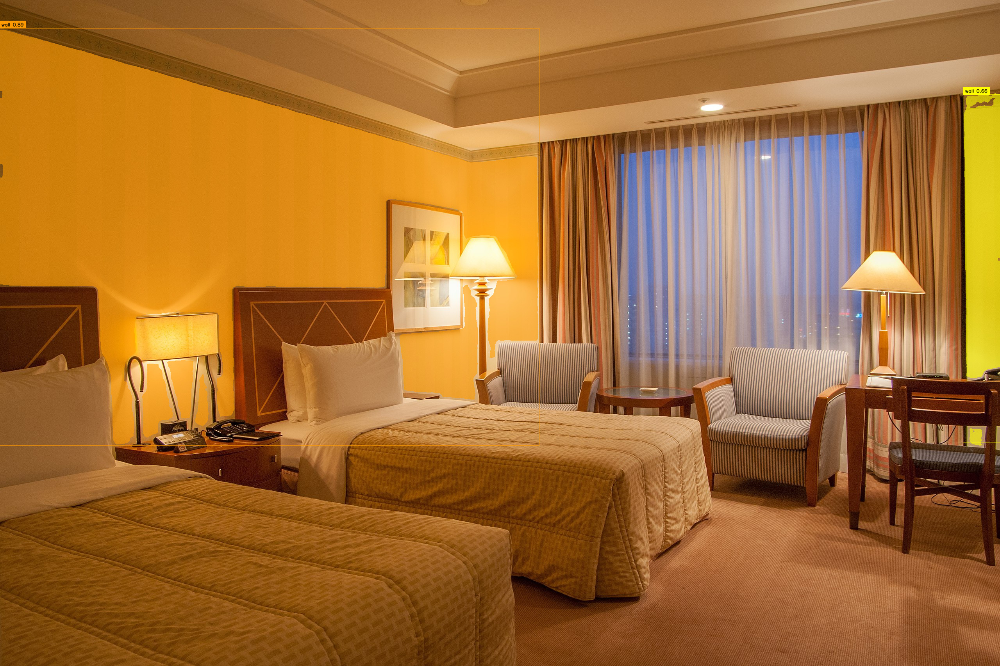

In [107]:
from PIL import Image
from IPython.display import display

PROMPT = "wall"
IMAGE_PATH = '/content/room4.jpg'

image = Image.open(IMAGE_PATH).convert("RGB")
inference_state = processor.set_image(image)
inference_state = processor.set_text_prompt(state=inference_state, prompt=PROMPT)

detections = from_sam(sam_result=inference_state)
detections = detections[detections.confidence > 0.5]

print(f"There are {len(detections)} {PROMPT} objects detected in the image.\n")
annotate(image, detections, label=PROMPT)

# **PAINT**

In [108]:
import numpy as np
import matplotlib.pyplot as plt

image_np = np.array(image).copy()


In [109]:
wall_mask = detections[1].mask

# 1. Convert torch tensor → numpy
if hasattr(wall_mask, "cpu"):
    wall_mask = wall_mask.cpu().numpy()

# 2. Remove ALL extra dimensions
wall_mask = np.squeeze(wall_mask)

# 3. Convert to boolean
wall_mask = wall_mask.astype(bool)


In [94]:
print("Image shape:", image_np.shape)
print("Mask shape:", wall_mask.shape)


Image shape: (1707, 2560, 3)
Mask shape: (1707, 2560)


In [110]:
# Choose a very obvious color
paint_color = np.array([255, 0, 0], dtype=np.uint8)  # Red

# Paint wall pixels
image_np[wall_mask] = paint_color


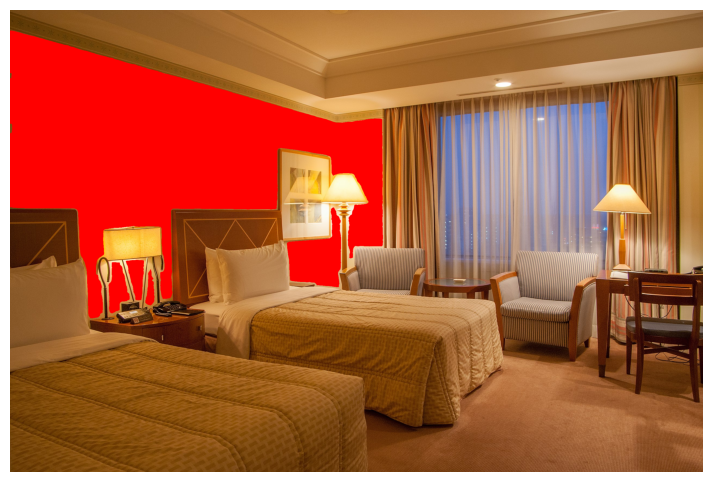

In [111]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
plt.imshow(image_np)
plt.axis("off")
plt.show()


# CONVERT TO HSV to preserve luminance




In [103]:
import cv2
import numpy as np

image_bgr = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
hsv = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2HSV)


In [98]:
paint_hue = 0        # red
paint_strength = 0.6 # 0.3–0.7 recommended


In [104]:
hsv_painted = hsv.copy()

# Scale saturation instead of replacing it
hsv_painted[wall_mask, 0] = paint_hue
hsv_painted[wall_mask, 1] = (
    hsv[wall_mask, 1] * (1 - paint_strength)
    + 255 * paint_strength
)

# Keep brightness exactly as-is


In [105]:
hsv_painted = np.clip(hsv_painted, 0, 255).astype(np.uint8)
painted_bgr = cv2.cvtColor(hsv_painted, cv2.COLOR_HSV2BGR)
painted_rgb = cv2.cvtColor(painted_bgr, cv2.COLOR_BGR2RGB)


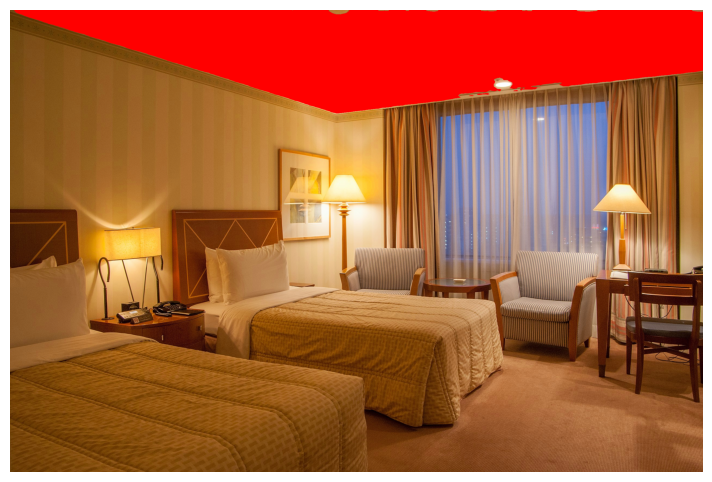

In [106]:
plt.figure(figsize=(12,6))
plt.imshow(painted_rgb)
plt.axis("off")
plt.show()


-------------------------------

There are 2 wall objects detected in the image.



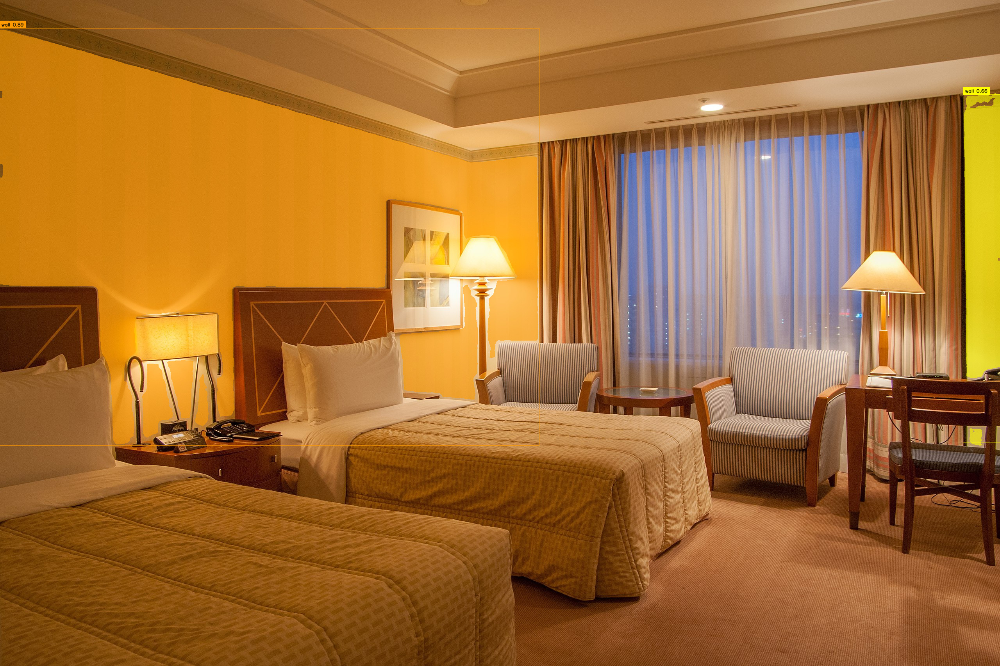

In [26]:
from PIL import Image
from IPython.display import display

PROMPT = "wall"
IMAGE_PATH = '/content/room4.jpg'

image = Image.open(IMAGE_PATH).convert("RGB")
inference_state = processor.set_image(image)
inference_state = processor.set_text_prompt(state=inference_state, prompt=PROMPT)

detections = from_sam(sam_result=inference_state)
detections = detections[detections.confidence > 0.5]

print(f"There are {len(detections)} {PROMPT} objects detected in the image.\n")
annotate(image, detections, label=PROMPT)